# The Problem
I would like to use machine learning to determine the liklihood that a subject will default on their credit card, based on a variety of factors like amount of the given credit, sex, education level, marital status, age, past payment amounts, past bill amounts, and past payment amounts.

# Task 1
I used an implementation of a four-layer neural network using Tensorflow on Kaggle as a jumping off point for my implementation of a two-layer neural network (https://www.kaggle.com/code/mirichoi0218/ann-making-model-for-binary-classification). I was completely unfamiliar with Tensorflow prior to this homework, so this code introduced me to useful functions and tools to create a NN, like tf.placeholder, tf.Variable, tf.sigmoid, tf.softmax, tf.train.GradientDescentOptimizer, Tensorflow sessions, and some others. I also frequently referred to the Tensorflow documentation to understand these functions. Some pages I found most useful were the ones detailing the different Keras layers (https://www.tensorflow.org/api_docs/python/tf/keras/layers), as this provided me with options for which activation functions I wanted to use in my NN, and the softmax_cross_entropy_with_logits (https://www.tensorflow.org/api_docs/python/tf/nn/softmax_cross_entropy_with_logits), which I initially was going to use in my cost function but scrapped the idea later on. To generate initial random weights, I found a resource describing tf.random_normal (https://docs.w3cub.com/tensorflow~python/tf/random_normal). Lastly, to help optimize the gradient descent algorithm, I used AdamOptimizer and referenced the Tensorflow page to understand how to use it (https://www.tensorflow.org/api_docs/python/tf/compat/v1/train/AdamOptimizer).

# Task 2
### Exploratory Data Analysis
Not much data cleaning had to be done as there were no missing or Na values and all variables were expressed as integers.

In [1]:
#import required libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

from sklearn import tree
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler

2022-10-06 21:17:19.838716: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-06 21:17:19.985941: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-06 21:17:19.985979: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-10-06 21:17:20.012703: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-06 21:17:20.863200: W tensorflow/stream_executor/platform/de

In [2]:
# data source: https://www.kaggle.com/datasets/mariosfish/default-of-credit-card-clients
df = pd.read_csv('doccc.csv')

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,dpnm
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:
df.isna().sum()

ID           0
LIMIT_BAL    0
SEX          0
EDUCATION    0
MARRIAGE     0
AGE          0
PAY_1        0
PAY_2        0
PAY_3        0
PAY_4        0
PAY_5        0
PAY_6        0
BILL_AMT1    0
BILL_AMT2    0
BILL_AMT3    0
BILL_AMT4    0
BILL_AMT5    0
BILL_AMT6    0
PAY_AMT1     0
PAY_AMT2     0
PAY_AMT3     0
PAY_AMT4     0
PAY_AMT5     0
PAY_AMT6     0
dpnm         0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ID         30000 non-null  int64
 1   LIMIT_BAL  30000 non-null  int64
 2   SEX        30000 non-null  int64
 3   EDUCATION  30000 non-null  int64
 4   MARRIAGE   30000 non-null  int64
 5   AGE        30000 non-null  int64
 6   PAY_1      30000 non-null  int64
 7   PAY_2      30000 non-null  int64
 8   PAY_3      30000 non-null  int64
 9   PAY_4      30000 non-null  int64
 10  PAY_5      30000 non-null  int64
 11  PAY_6      30000 non-null  int64
 12  BILL_AMT1  30000 non-null  int64
 13  BILL_AMT2  30000 non-null  int64
 14  BILL_AMT3  30000 non-null  int64
 15  BILL_AMT4  30000 non-null  int64
 16  BILL_AMT5  30000 non-null  int64
 17  BILL_AMT6  30000 non-null  int64
 18  PAY_AMT1   30000 non-null  int64
 19  PAY_AMT2   30000 non-null  int64
 20  PAY_AMT3   30000 non-null  int64
 21  PAY_AMT4   3

In [6]:
df['dpnm'].value_counts(normalize=True)

0    0.7788
1    0.2212
Name: dpnm, dtype: float64

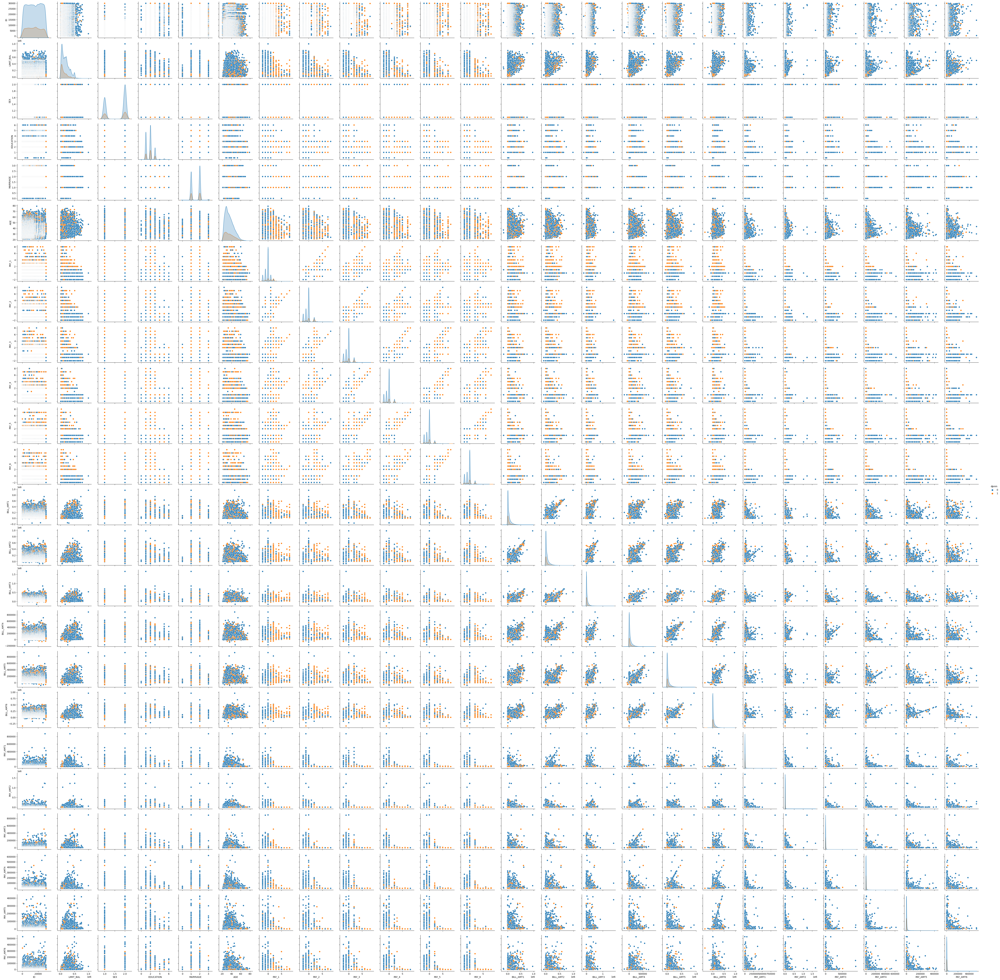

In [7]:
sns.pairplot(df,hue='dpnm')
plt.show()

In [8]:
df.isnull().any(axis=0)

ID           False
LIMIT_BAL    False
SEX          False
EDUCATION    False
MARRIAGE     False
AGE          False
PAY_1        False
PAY_2        False
PAY_3        False
PAY_4        False
PAY_5        False
PAY_6        False
BILL_AMT1    False
BILL_AMT2    False
BILL_AMT3    False
BILL_AMT4    False
BILL_AMT5    False
BILL_AMT6    False
PAY_AMT1     False
PAY_AMT2     False
PAY_AMT3     False
PAY_AMT4     False
PAY_AMT5     False
PAY_AMT6     False
dpnm         False
dtype: bool

In [9]:
df.isnull().any(axis=1).sum()

0

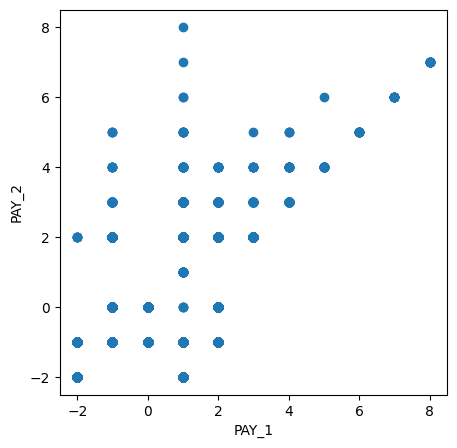

In [10]:
#there seems to be a moderate correlation between payment amounts
fig, ax = plt.subplots(figsize=(5,5))
ax.scatter(df['PAY_1'], df['PAY_2'])
ax.set_xlabel('PAY_1')
ax.set_ylabel('PAY_2')
plt.show()

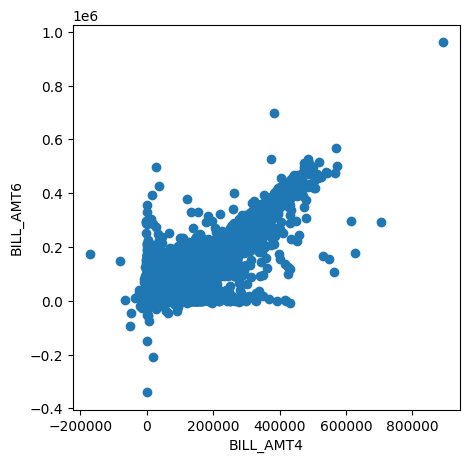

In [11]:
#there seems to be a fairly strong correlation between bill amounts too
fig, ax = plt.subplots(figsize=(5,5))
ax.scatter(df['BILL_AMT4'], df['BILL_AMT6'])
ax.set_xlabel('BILL_AMT4')
ax.set_ylabel('BILL_AMT6')
plt.show()

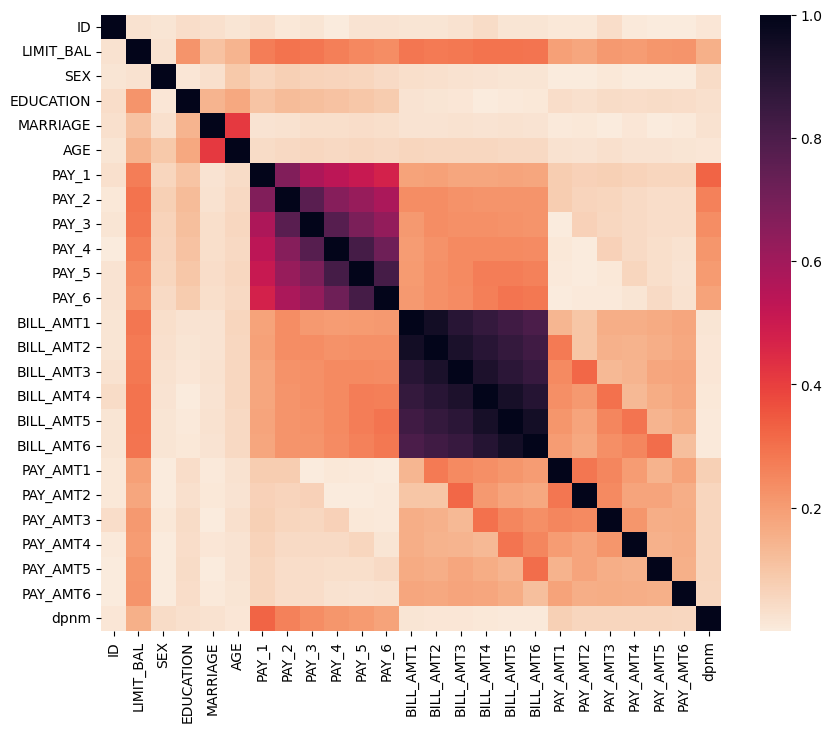

In [12]:
#the strongest correlations are clearly between bill amounts and between pays
#these categories could possibly be combined into an average to increase simplicty of the data
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(df.corr().abs(),annot=False, ax=ax, cmap='rocket_r')
plt.show()

In [13]:
# feature correlation with target variable
df.corr()['dpnm'].sort_values(ascending=False)

dpnm         1.000000
PAY_1        0.324794
PAY_2        0.263551
PAY_3        0.235253
PAY_4        0.216614
PAY_5        0.204149
PAY_6        0.186866
EDUCATION    0.028006
AGE          0.013890
BILL_AMT6   -0.005372
BILL_AMT5   -0.006760
BILL_AMT4   -0.010156
ID          -0.013952
BILL_AMT3   -0.014076
BILL_AMT2   -0.014193
BILL_AMT1   -0.019644
MARRIAGE    -0.024339
SEX         -0.039961
PAY_AMT6    -0.053183
PAY_AMT5    -0.055124
PAY_AMT3    -0.056250
PAY_AMT4    -0.056827
PAY_AMT2    -0.058579
PAY_AMT1    -0.072929
LIMIT_BAL   -0.153520
Name: dpnm, dtype: float64

### Train-Dev-Test Split

In [14]:
train,left = train_test_split(df, test_size=0.2, random_state=42)
valid,test = train_test_split(df, test_size=0.5, random_state=42)

#drop ID column
train_id = train['ID']
valid_id = valid['ID']
test_id = test['ID']

train_data = train.iloc[:,1:]
valid_data = valid.iloc[:,1:]
test_data = test.iloc[:,1:]

#regularize data sets with MinMaxScalar
train_x = train_data.iloc[:,1:]
train_x = MinMaxScaler().fit_transform(train_x)

valid_x = valid_data.iloc[:,1:]
valid_x = MinMaxScaler().fit_transform(valid_x)

test_x = test_data.iloc[:,1:]
test_x = MinMaxScaler().fit_transform(test_x)

train_y = train_data.iloc[: , -1:]
valid_y = valid_data.iloc[: , -1:]
test_y = test_data.iloc[: , -1:]

### Implementing Forward Propagation

In [15]:
tf.compat.v1.disable_eager_execution()

#set placeholders
newx = tf.compat.v1.placeholder(tf.float32, [None,23])
newy = tf.compat.v1.placeholder(tf.float32, [None, 1])

In [16]:
# weights
W1 = tf.Variable(tf.compat.v1.random_normal([23,50], seed=0), name='weight1')
W2 = tf.Variable(tf.compat.v1.random_normal([50,75], seed=0), name='weight2')
W3 = tf.Variable(tf.compat.v1.random_normal([75,1], seed=0), name='weight3')

# biases
b1 = tf.Variable(tf.compat.v1.random_normal([50], seed=0), name='bias1')
b2 = tf.Variable(tf.compat.v1.random_normal([75], seed=0), name='bias2')
b3 = tf.Variable(tf.compat.v1.random_normal([1], seed=0), name='bias3')

In [17]:
#forward propagation
#computations for input and two hidden layers
a1 = tf.nn.sigmoid(tf.matmul(newx,W1) + b1)
a2 = tf.nn.sigmoid(tf.matmul(a1,W2) + b2)

#output
yhat = tf.matmul(a2,W3) + b3

### Computing the Cost Function

In [18]:
predict = tf.nn.sigmoid(yhat)

#cost function
cost_i = tf.nn.sigmoid_cross_entropy_with_logits(logits=yhat,labels=newy)
cost = tf.reduce_mean(cost_i)

### Implementing Gradient Descent and Review Results Using the Test Set

In [19]:
#Gradient descent and its optimization
#train = tf.compat.v1.train.GradientDescentOptimizer(learning_rate=0.1).minimize(cost)
train = tf.compat.v1.train.AdamOptimizer(0.01).minimize(cost)

In [20]:
prediction = tf.cast(predict > 0.5, dtype=tf.float32)
correct_prediction = tf.equal(prediction, newy)
accuracy = tf.reduce_mean(tf.cast(correct_prediction, dtype=tf.float32))

In [21]:
cost_summary = []

#start Tensorflow session and train model
#print loss and accuracy every 10 steps
#add loss to cost_summary every 10 steps
with tf.compat.v1.Session() as sess:
    sess.run(tf.compat.v1.global_variables_initializer())
    for step in range(100):
        sess.run(train, feed_dict={newx: train_x, newy: train_y})
        if step % 10 == 0:
            loss, acc = sess.run([cost, accuracy], feed_dict={newx: train_x, newy: train_y})
            print("Step: {:5}\tLoss: {:.3f}\tAcc: {:.2%}".format(step, loss, acc))
            cost_summary.append(loss)
            
    train_acc = sess.run(accuracy, feed_dict={newx: train_x, newy: train_y})
    valid_acc,valid_predict,valid_correct = sess.run([accuracy,prediction,correct_prediction], feed_dict={newx: valid_x, newy: valid_y})
    print("Model Prediction =", train_acc)
    print("Validation Prediction =", valid_acc)
    
    #run on test set
    test_acc,test_predict,test_correct = sess.run([accuracy,prediction,correct_prediction], feed_dict={newx: test_x, newy: test_y})
    print("Test Accuracy =", test_acc)

2022-10-06 21:28:09.800963: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-06 21:28:09.801025: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-06 21:28:09.801063: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (DESKTOP-341S1PU): /proc/driver/nvidia/version does not exist
2022-10-06 21:28:09.801371: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-06 21:28:09.807858: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimiz

Step:     0	Loss: 7.248	Acc: 22.18%
Step:    10	Loss: 1.343	Acc: 77.82%
Step:    20	Loss: 0.485	Acc: 78.15%
Step:    30	Loss: 0.230	Acc: 99.13%
Step:    40	Loss: 0.063	Acc: 99.60%
Step:    50	Loss: 0.035	Acc: 99.84%
Step:    60	Loss: 0.020	Acc: 99.98%
Step:    70	Loss: 0.012	Acc: 99.98%
Step:    80	Loss: 0.008	Acc: 99.98%
Step:    90	Loss: 0.006	Acc: 99.99%
Model Prediction = 0.9999167
Validation Prediction = 0.99986666
Test Accuracy = 1.0


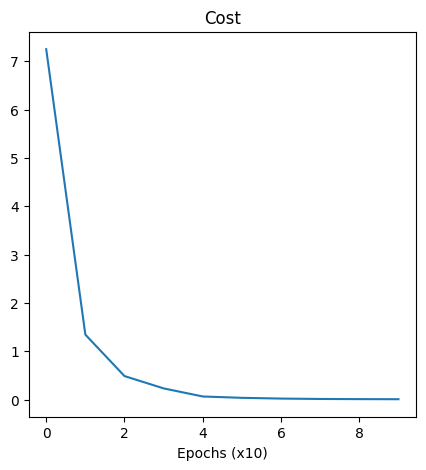

In [22]:
#show loss convergence
fig, ax = plt.subplots(figsize=(5,5))

ax.plot(cost_summary)
ax.set_title('Cost')

plt.xlabel('Epochs (x10)')
plt.show()

# Task 3
### Number of Nodes
Initially I arbitrarily picked both layers to be size 230, as that was 10 times the size of the input. After the first few rounds of training, I decreased the number of nodes in both layers, decreasing the first layer by more than the second, and found that the speed of training increased slightly without a noticeable drop in accuracy. So, I kept the number of nodes in the first and second hidden layers at 50 and 75 respectively.
### Number of Layers
I experimented with adding a third layer with 100 nodes and found that it increased the speed at which the accuracy of my model reached 100%. With 2 layers it takes around 100 iterations to reach close to 100% accuracy (with AdamOptimizer and regularized data), whereas it took only around 50 to 60 iterations with three layers (also with AdamOptimizer and regularized data). 
### Learning Rate
Initially, I had my learning rate set arbitrarily to 0.1. With vanilla gradient descent this worked perfectly fine, however after applying AdamOptimizer, the rate was too large and the accuracy of my model suffered. Decreasing the learning rate to 0.01 helped my model quickly reach a high level of accuracy without large fluctuations in the cost function.
### Regularization
I regularized my data with MinMaxScaler. Initially, without regularized data my model achieved about 77% accuracy after 100 iterations. I could increase the number of iterations to improve the model's accuracy and incur a longer training delay. Instead, I chose to regularlize the input data in order to more quickly improve my model's accuracy.
### Gradient Descent Optimization
At first I utilized vanilla gradient descent with Tensorflow's GradientDescentOptimizer and found this worked well with my data, achieving around 100% accuracy with regularized data after about 100 iterations. Later on, I added an optimization technique, AdamOptimizer, and, after adjusting the learning rate downward, there was a distinct increase the rate that the cost function decreased and model accuracy increased. Now, with AdamOptimizer and regularlized data my model reached 100% accuracy after around 50 to 60 iterations.

# Task 4
### Decision Tree Classifier

In [23]:
# Initialize our decision tree object
# Set max_depth to 10 to prevent the tree from being excessively large and complex
classification_tree = tree.DecisionTreeClassifier(max_depth = 10)

#Split the data again
X_train_tree, X_left_tree, y_train_tree, y_left_tree = train_test_split(X,y, train_size=0.8,random_state=100)
X_valid_tree, X_test_tree, y_valid_tree, y_test_tree = train_test_split(X_left_tree,y_left_tree, test_size=0.5,random_state=100)

# Train our decision tree (tree induction + pruning)
classification_tree = classification_tree.fit(X_train_tree,y_train_tree)

NameError: name 'X' is not defined

In [ ]:
tree.plot_tree(classification_tree)

In [ ]:
#run with validation set
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(classification_tree, X_valid_tree, y_valid_tree, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
print(n_scores);

print('mean: ' + str(np.mean(n_scores)))
print('standard dev: ' + str(np.std(n_scores)))

In [ ]:
#run with test set
cv2 = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores2 = cross_val_score(classification_tree, X_test_tree, y_test_tree, scoring='accuracy', cv=cv2, n_jobs=-1, error_score='raise')
print(n_scores2);

print('mean: ' + str(np.mean(n_scores2)))
print('standard dev: ' + str(np.std(n_scores2)))

### Comparison of NN and Tree Classifier
Both the two layer neural network and decision tree classifier had similar accuracies without any data regularization or gradient descent optimizations. However, the decision tree classifier, without limiting its maximum depth significantly, was impractical to use on this large of a data set. Furthermore, without limiting its depth the decision tree was incredibly slow. The reason that the decision tree classifier worked at all was likely because the decision to be made was a simple one: will the subject default or will they not default. If the decision was more complex and involved more options or even variables, the neural network would likely beat the decision tree classifier by a larger margin as neural networks handle complexity and large quantities of data much better. Furthermore, the two layer neural network required no limitations and trained much faster than the decision tree, making it a better fit for this problem using this data.